**EE 610 Assignment 3**





In [ ]:
#Adding the libraries

import matplotlib.pyplot as plt
from pywt import dwt2,idwt2
from matplotlib import cm
from PIL import Image
import numpy as np
import cv2

In [ ]:
#Auxillary functions
#Used for inline image display
def imdisp(img):
    #Display the stored image in numpy array format and displays
    if len(img.shape)==3:
        img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_PIL = Image.fromarray(img)
    display(img_PIL)


def implt(img):
    plt.imshow(img,cmap='gray')
    plt.show()
    
    
def implt3(img):
    #Plots color images inline using matplotlib
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

#Reference

**Question 1**

**Part A**

**Add Additive White Gaussian Noise (AWGN) with variable variance to the image**

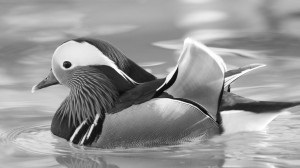

(168, 300)


In [ ]:
from google.colab.patches import cv2_imshow   #cv2_imshow to display the image
img = cv2.imread("/content/bird.jpg",cv2.IMREAD_GRAYSCALE)       #read the image
imdisp(img)                              #dispaly the image
print(img.shape)                             #prints the shape of image

Added noise content:


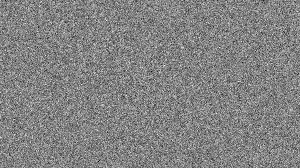

Image after Gausian noise addition:


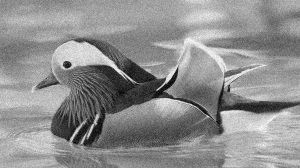

In [ ]:
#function to add gaussian noise using numpy
def add_gaussian_noise(img,variance,hide_plots=False):
  pict=img.copy()   #Duplicating image
  mean = 0          #taking mean of gaussian noise =0 as AWGN mean = 0
  sigma = variance**0.5    #variance is sigma square
  g_noise = np.random.normal(mean,sigma, pict.shape)  #to generate gaussian noise
  noisy_img=pict+g_noise #adding noise to image.Image after noise addition exceeds 0 and 255 boundary
  cv2.normalize(noisy_img, noisy_img, 0, 255, cv2.NORM_MINMAX, dtype=-1) #Rescaling back o 0-255 boundary
  noisy_img=noisy_img.astype('uint8') #TType casting back to uint8 format

  if (hide_plots==False):
    #Printing Gaussian Noise
    cv2.normalize(g_noise, g_noise, 0, 255, cv2.NORM_MINMAX, dtype=-1) #Rescaling back o 0-255 boundary
    g_noise=g_noise.astype('uint8') #TType casting back to uint8 format
    print("Added noise content:")
    imdisp(g_noise)

  return noisy_img

#Using function to add noise to image
gnoise_img=add_gaussian_noise(img,80)
print("Image after Gausian noise addition:")
imdisp(gnoise_img)

Denoised image:


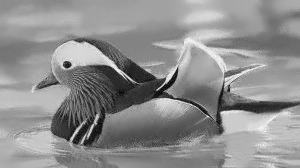

In [ ]:
#Denoising image using  astNlMeansDenoising function in CV2
#Ref: https://docs.opencv.org/3.4/d1/d79/group__photo__denoise.html
denoise_img=gnoise_img.copy() #Duplicating the image

#Generate denoised image
cv2.fastNlMeansDenoising(gnoise_img,denoise_img,7,7,21) # Module assume noise to be gaussian in nature
print("Denoised image:")
imdisp(denoise_img) #Printing denoised image

**Part B**

**To measure Peak Signal to Noise Ratio (PSNR)**

In [ ]:
#Ref: https://www.ni.com/en-in/innovations/white-papers/11/peak-signal-to-noise-ratio-as-an-image-quality-metric.html

def PSNR(img_x, img_y, R=255): 
  #R denotes the maximum possible intensity levels in [0,255]
  x_img=img_x.astype('float32')
  y_img=img_y.astype('float32')
  MSE = np.mean((x_img - y_img)**2)  #mean square error 
  if MSE==0:
    PSNR=-1                          #Invalid PSNR value in both images are identical
  else:
    PSNR = 10*np.log10(R**2/MSE)     #compute PSNR
  return PSNR

#Computing PSNR between original and denoised image
print("PSNR between the original and denoised image is ", PSNR(img,denoise_img), "dB")

PSNR between the original and denoised image is  26.751576534224732 dB


PSNR decreases with increase in the variance of the signal

**Part C**

**To measure SSIM**

In [ ]:
#Ref:
#a) Zhou Wang, A. C. Bovik, H. R. Sheikh and E. P. Simoncelli, "Image quality assessment: from error visibility to structural similarity," in IEEE Transactions on Image Processing

def SSIM(img_x, img_y, alpha=1,beta=1,gamma=1):
    x_img=img_x.astype('float32')  #Convert format from uint8 to float32
    y_img=img_y.astype('float32')  #Format format from uint8 to float32
    N=x_img.shape[0]*x_img.shape[1] #N=Number of pixel in image


    k1,k2=0.01,0.03  #Coefficient of C1&C2 computation as mentioned in refa
    C1 = (k1*255)**2 #Coefficient for l(uminosity)
    C2 = (k2*255)**2 #Coefficient for c(ontrast)
    C3=C2/2          #Coefficient for s(truture)

    ux,uy=np.mean(x_img),np.mean(y_img)   #Mean of x,y images
    sigx=np.sqrt(np.mean((x_img-ux)**2)*N/(N-1)) #std.dev of x image
    sigy=np.sqrt(np.mean((y_img-uy)**2)*N/(N-1)) #std.dev of x image
    sigxy=np.mean((x_img-ux)*(y_img-uy))*N/(N-1) #cross.var of xy image

    l=(2*ux*uy+C1)/(ux**2+uy**2+C1) #Finding l index
    c=(2*sigx*sigy+C2)/(sigx**2+sigy**2+C2) #Finding c index
    s=(sigxy+C3)/(sigx*sigy+C3) #Finding s index

    ssim=(l**alpha)*(c**beta)*(s**gamma) #SSIM=(l^alpha)*(c^beta)*(s^gamma)
    return ssim

def mSSIM(img_x,img_y, alpha=1,beta=1,gamma=1):
    x_img=img_x.astype('float32')  #Convert format from uint8 to float32
    y_img=img_y.astype('float32')  #Format format from uint8 to float32
    N=x_img.shape[0]*x_img.shape[1] #N=Number of pixel in image

    k1,k2=0.01,0.03  #Coefficient of C1&C2 computation as mentioned in ref1(<<1)
    C1 = (k1*255)**2 #Coefficient for l(uminosity)
    C2 = (k2*255)**2 #Coefficient for c(ontrast)
    C3=C2/2          #Coefficient for s(truture)

    ux=cv2.GaussianBlur(x_img,(11,11),1.5)
    uy=cv2.GaussianBlur(y_img,(11,11),1.5)

    sigx=np.sqrt(cv2.GaussianBlur(x_img*x_img,(11,11),1.5)-ux*ux)
    sigy=np.sqrt(cv2.GaussianBlur(y_img*y_img,(11,11),1.5)-uy*uy)
    sigxy=cv2.GaussianBlur(x_img*y_img,(11,11),1.5)-ux*uy

    l=(2*ux*uy+C1)/(ux**2+uy**2+C1) #Finding l index
    c=(2*sigx*sigy+C2)/(sigx**2+sigy**2+C2) #Finding c index
    s=(sigxy+C3)/(sigx*sigy+C3) #Finding s index

    ssim=(l**alpha)*(c**beta)*(s**gamma) #SSIM=(l^alpha)*(c^beta)*(s^gamma)
    mssim=np.mean(ssim)
    return mssim


SSIM(img,denoise_img)
mSSIM(img,denoise_img)


0.9127593

SSIM of original image with denoise image decreases with increase in the noise added to the original image.

**Part D :** 


**Isotropic gaussian blurring of an image for a given variance**

Added noise content:


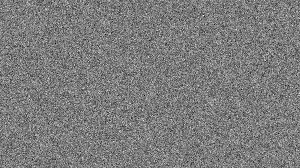

Image with gaussian noise varience=20:


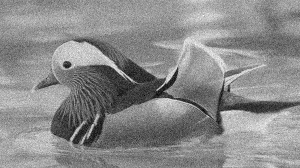

Noisy image after gaussian filtering:


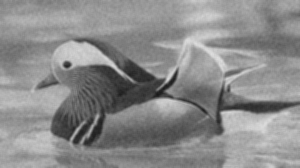

In [ ]:
#Using function to add noise to image
gnoise_img=add_gaussian_noise(img,200)
print("Image with gaussian noise varience=20:")
imdisp(gnoise_img)

#Denoising using gaussian blur function
gdenoised_img= cv2.GaussianBlur(gnoise_img, (3,3), np.sqrt(10),np.sqrt(10)) #Gaussian filtering, 3x3 kernal, std ded: sqrt(50)
print("Noisy image after gaussian filtering:")
imdisp(gdenoised_img)

Gaussian lowpass filtering removes the gainy noise . But it also remves the fine fetures in the bird in the image

**Question 2 Denoising in Wavele Domain** 

**PART A** 

**Hard Thresholding**

In [ ]:
#Defining function for DWT & IDWT 
def dwt(img,hide_plots=False):
    #Getting the coefficient: LL,LH,HL, HH 
    LL,(LH,HL,HH)=dwt2(img,'db3','periodization')

    if (hide_plots==False):
        #Plotting coefficients for visualisation
        plt.figure(figsize=(10,10))
        plt.suptitle("Wavelet Coefficients(After DWT)")
        plt.subplots_adjust(wspace=0.1,hspace=0.1) #Adjusting subplot spacing
        plt.subplot(2,2,1)  #Plotting LL in subplot 1
        plt.imshow(LL,cmap="gray")
        plt.subplot(2,2,2)  #Plotting LH in subplot 2
        plt.imshow(LH,cmap="gray")
        plt.subplot(2,2,3)  #Plotting HL in subplot 3
        plt.imshow(HL,cmap="gray")
        plt.subplot(2,2,4)  #Plotting HH in subplot 4
        plt.imshow(HH,cmap="gray")
        plt.show() #Display plot
    
    #Return coefficients
    return (LL,LH,HL,HH)

def idwt(coeff,hide_plots=False):

    if (hide_plots==False):
        #Plotting coefficients for visualisation
        plt.figure(figsize=(10,10))
        plt.suptitle("Wavelet Coefficients(Before IDWT)")
        plt.subplots_adjust(wspace=0.5,hspace=0.5) #Adjusting subplot spacing
        plt.subplot(2,2,1) #Plotting LL in subplot 1
        plt.imshow(coeff[0],cmap="gray")
        plt.subplot(2,2,2) #Plotting LH in subplot 2
        plt.imshow(coeff[1],cmap="gray")
        plt.subplot(2,2,3) #Plotting HL in subplot 3
        plt.imshow(coeff[2],cmap="gray")
        plt.subplot(2,2,4) #Plotting HH in subplot 4
        plt.imshow(coeff[3],cmap="gray")
        plt.show() #Display plot
    
    in_coeff=coeff[0],(coeff[1],coeff[2],coeff[3]) #Converts tuples into the required format
    iwt_img=idwt2(in_coeff,'db3','periodization').astype('uint8') #Computing IDWT & typcasting from double to uint8
    return(iwt_img)

def hardThresh(img,thresh,hide_plots=False):
    #Function for hard thresholding
    coeff=list(dwt(img,hide_plots)) #Coeficent conerted from tuple to list. For updtaing coefficients in the same list
    # Except LL all coefficents below<threshold set to zero
    for i in range(3):
        c=coeff[i+1]
        c[c<thresh]=0 #Values below threshold set to zero
        coeff[i+1]=c  #Updatig new coefficient in list
    coeff=tuple(coeff) #Converting back from list to tuple
     
    return idwt(coeff,hide_plots)

def softThresh(img,thresh,hide_plots=False):
    #Function for hard thresholding
    coeff=list(dwt(img,hide_plots)) #Coeficent conerted from tuple to list. For updtaing coefficients in the same list
    # Except LL all coefficents below<threshold set to zero
    for i in range(3):
        c=coeff[i+1]-thresh #Substracting threshold from values
        c[c<0]=0            #Values below zero set to zero
        coeff[i+1]=c        #Updatig new coefficient in list
    coeff=tuple(coeff)      #Converting back from list to tuple
     
    return idwt(coeff,hide_plots)


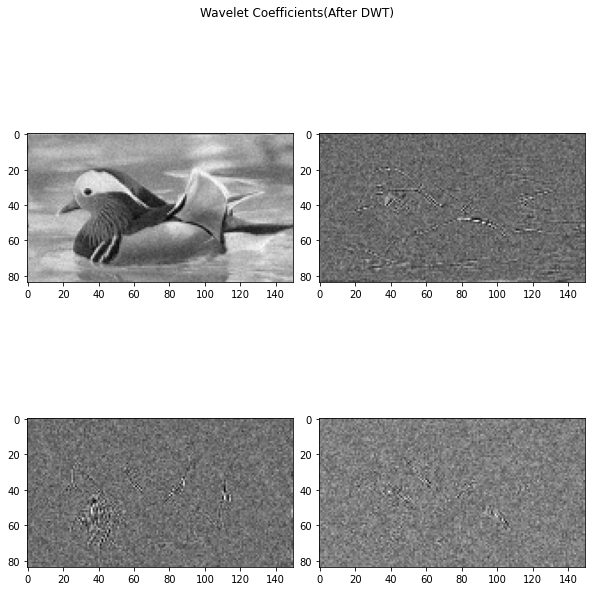

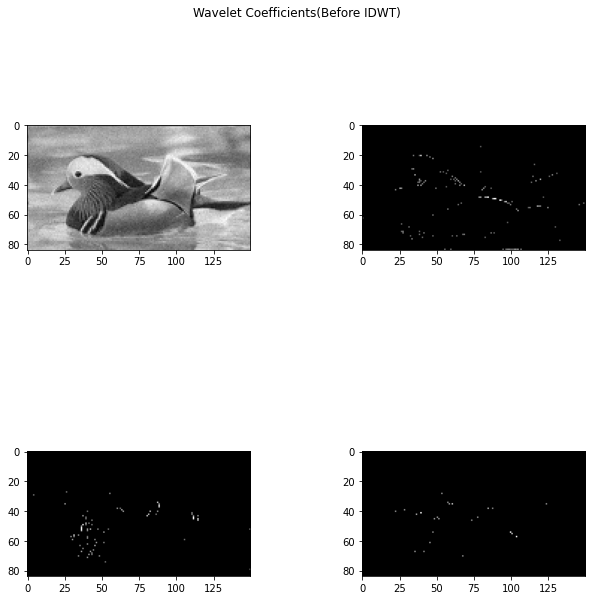

Image after hard thresholding


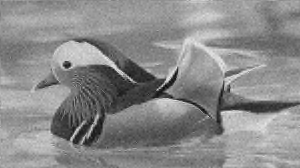

In [ ]:
#Hard thresholding noisy image
hth_img=hardThresh(gnoise_img,40)
print("Image after hard thresholding")
imdisp(hth_img) #display image

The image generated from hard thrsholding appears less grainy than the image with gaussian added with noise. In comparison with the image recovered with gussian filter, the hard threshold image has better contrast and more visible features


In [ ]:
#Comparing SSIMindex for hard thrsholding
print("SSIM for the noise image:",mSSIM(img,gnoise_img))
print("SSIM for Gaussian Denoised image:",mSSIM(img,gdenoised_img))
print("SSIM for Hard Thresholded image:",mSSIM(img,hth_img))

SSIM for the noise image: 0.6079938
SSIM for Gaussian Denoised image: 0.79158795
SSIM for Hard Thresholded image: 0.7602998


The SSIM of the Hard threshold image is better than noise image. The SIM of gaussian filterd noise in worse than the noise image. This could because of the loss of sharp  features due to the gaussian denoising process

In [ ]:

#SSIM comparison with ssimmodule from skimage
from skimage.metrics import structural_similarity as ssim
print("SSIM for the noise image:",ssim(img,gnoise_img))
print("SSIM for Gaussian Denoised image:",ssim(img,gdenoised_img))
print("SSIM for Hard Thresholded image:",ssim(img,hth_img))

SSIM for the noise image: 0.6426243522820814
SSIM for Gaussian Denoised image: 0.7993869331019993
SSIM for Hard Thresholded image: 0.7776447906144516


**PART 2B** 

**Soft Thresholding**

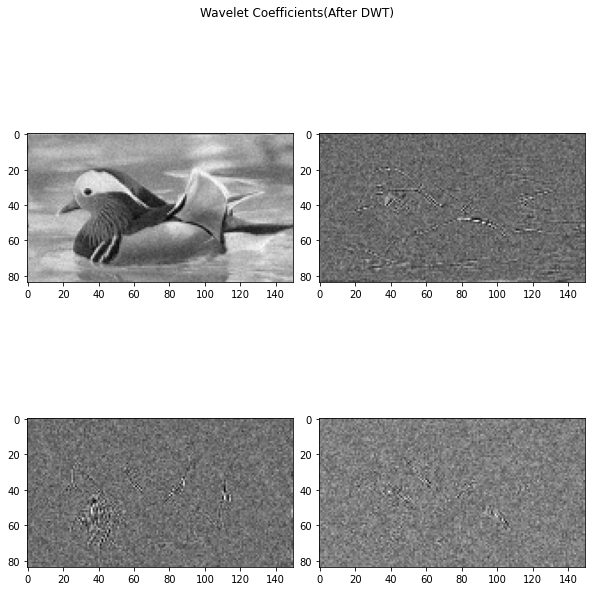

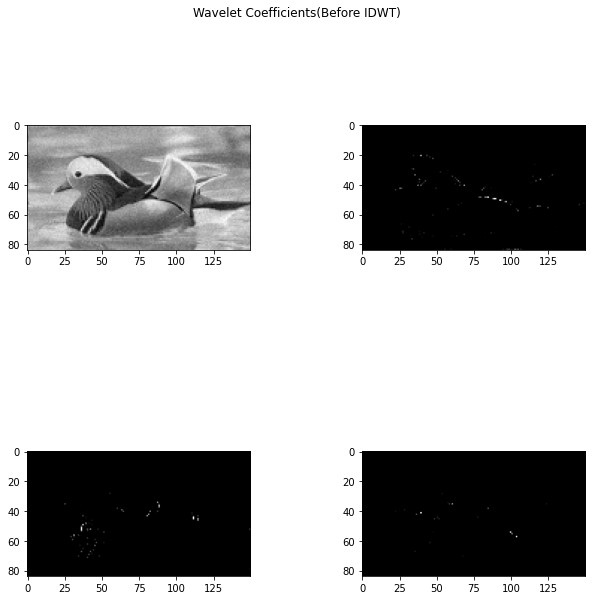

Image after soft thresholding


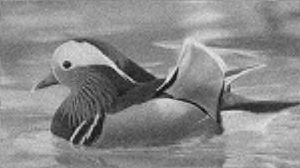

In [ ]:
#Soft thresholding noisy image
sth_img=softThresh(gnoise_img,40)
print("Image after soft thresholding")
imdisp(sth_img)

In [ ]:
print("SSIM for Hard Thresholded image:",SSIM(img,hth_img))
print("SSIM for Soft Thresholded image:",SSIM(img,sth_img))

SSIM for Hard Thresholded image: 0.9409132585197665
SSIM for Soft Thresholded image: 0.9386548317830371


No comparable distinguishing between hard and soft threholded images. SSIM wise hard thresholded image is much closer to the soft thresholded image

**PART 2C** 

**NeighShrink Thresholding**

In [ ]:
#Ref:
#a: IMAGE DENOISING USING NEIGHBOURING WAVELET COEFFICIENTS:G. Y. Chen, T. D. Bui and A. Krzyzak

def neighThresh(img,thresh,hide_plots=False):
    #Function for NeighShink thresholding
    W=5 #Width of neighbourhood, N= 3 or 5 preferably
    w=(W-1)/2 # Halfwidth of neighbourhood
    coeff=list(dwt(img,hide_plots)) #Coeficent converted from tuple to list. For updtaing coefficients in the same list
    # Except LL all coefficents below<threshold set to zero
    #Iterate over coefficients
    for i in range(3):
        c=coeff[i+1] #Starting from index i=1,ignoring LL
        c_new=c.copy() #Duplicating coefficient array 
        M,N=c.shape[0],c.shape[1] #Getting the size of the array, then iterating for all elements in array
        for m in range(M):
            for n in range(N):
                rl,rh=np.max([0,m-w]).astype('int'),np.min([m+w+1,M]).astype('int') # Min & max row boundary of neighbourhood should not cross 0 & M-1
                cl,ch=np.max([0,n-w]).astype('int'),np.min([n+w+1,N]).astype('int') # Min & max column boundary of neighbourhood should not cross 0 & N-1
                s=np.sum(c[rl:rh,cl:ch]**2) # Get sum of squres of intensity values in neighbourhood
                beta=(1-thresh**2/s**2) # Compute shrinkage factor
                c_new[m,n]=c[m,n]*beta # With shringake factor, recompute the new intensity
        c_new[c_new<0]=0 # Coefficients with value less than zero are made zero
        coeff[i+1]=c_new # Replace old coefficients
        
    coeff=tuple(coeff) #Converting back from list to tuple
    return idwt(coeff,hide_plots)

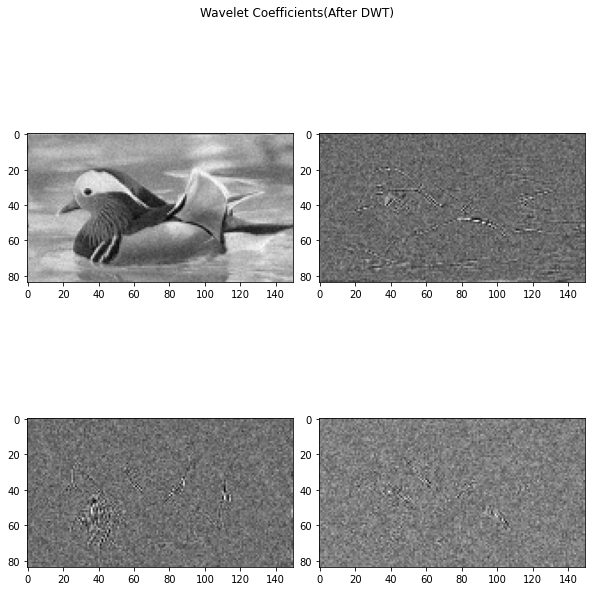

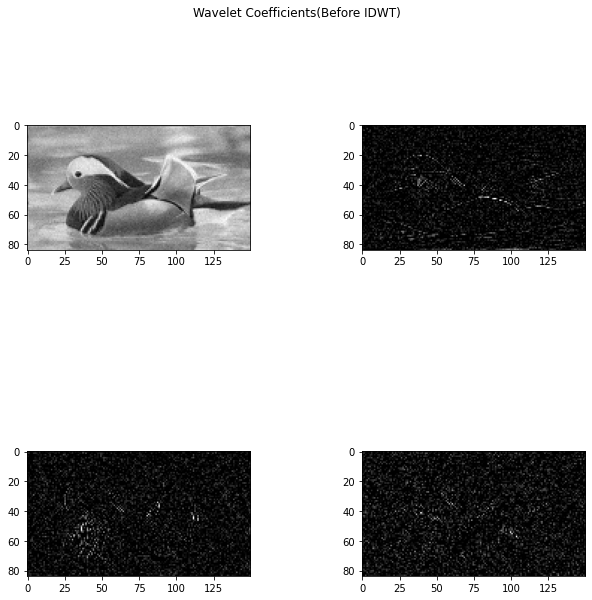

Image after NeighShrink thresholding


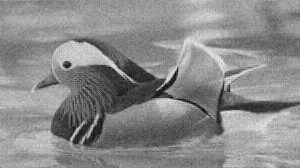

In [ ]:
#Neighbourhood thresholding noisy image
nth_img=neighThresh(gnoise_img,40)
print("Image after NeighShrink thresholding")
imdisp(nth_img) #display image

In [ ]:
print("SSIM for Hard Thresholded image:",SSIM(img,hth_img))
print("SSIM for Soft Thresholded image:",SSIM(img,sth_img))
print("SSIM for Neighbourhood Thresholded image:",SSIM(img,nth_img))

SSIM for Hard Thresholded image: 0.9409132585197665
SSIM for Soft Thresholded image: 0.9386548317830371
SSIM for Neighbourhood Thresholded image: 0.9358041614021891


**Question 3 PSNR & SSIM Comparison** 

A) Noise Variance

B) GLP for various variance

C) Soft & Hard Thresholding (Proposed by Donoho et al.)

D) NeighShrink (Proposed by Chen et al.)

In [ ]:
#Function declaration of color image comparision
def cSSIM(imgRGB_x,imgRGB_y):
    #SSIM for color image: mean of SSIM of individual channels
    sum=0
    for i in range(3):
        sum=sum+SSIM(imgRGB_x[:,:,i],imgRGB_y[:,:,i]) #SSIM computation for individual color channels
    sum=sum/3 #Net SSIM is average SSIM of all channels
    return sum

def hardThresh3(imgRGB,thresh,hide_plots=False):
    #Color image hard thrsholding by independent thresholding on RGB channels
    hth_imgRGB=imgRGB.copy() #Duplicate image
    #Iterate over individual channels
    for i in range(3):
        hth_imgRGB[:,:,i]=hardThresh(imgRGB[:,:,i],thresh,hide_plots) #Applying hard threshold for individual channels
    return hth_imgRGB

def softThresh3(imgRGB,thresh,hide_plots=False):
    #Color image soft thresholding by independent thresholding on RGB channels
    sth_imgRGB=imgRGB.copy() #Duplicate image
    #Iterate over individual channels
    for i in range(3):
        sth_imgRGB[:,:,i]=softThresh(imgRGB[:,:,i],thresh,hide_plots)  #Applying soft threshold for individual channels
    return sth_imgRGB

def neighThresh3(imgRGB,thresh,hide_plots=False):
    #Color image NeighShrink thresholding by independent thresholding on RGB channels
    nth_imgRGB=imgRGB.copy() #Duplicate image
    #Iterate over individual channels
    for i in range(3):
        nth_imgRGB[:,:,i]=neighThresh(imgRGB[:,:,i],thresh,hide_plots) #Applying NeighShrink threshold for individual channels
    return nth_imgRGB

Reading a color image and adding noise to it

Color image


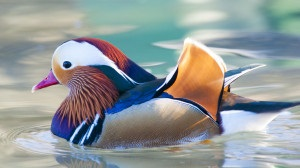

(168, 300, 3)
Added noise content:


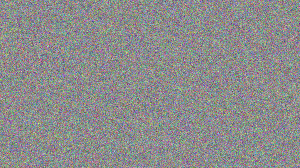

Color image with Gaussian Noise added(Sigma=10)


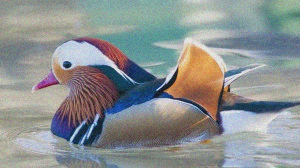

True

In [ ]:
#from google.colab.patches import cv2_imshow         #cv2_imshow to display the image
cimg = cv2.imread("bird.jpg",cv2.IMREAD_COLOR)       #read the image
print("Color image")
imdisp(cimg)                                         #dispaly the image
print(cimg.shape)                                    #print the shape of image
#function to add gaussian noise using numpy
noisy_cimg=add_gaussian_noise(cimg,100) #Adding noise to color image
print("Color image with Gaussian Noise added(Sigma=10)")
imdisp(noisy_cimg)
cv2.imwrite('/content/noisy_img.png',noisy_cimg)         #writes the image to the specified path


PSNR and SSIM Comparions for 
- Various added noise variance
- Gaussian filter at difference variance
- Hard/Soft Thresholding
- NeighShrink Thresholding

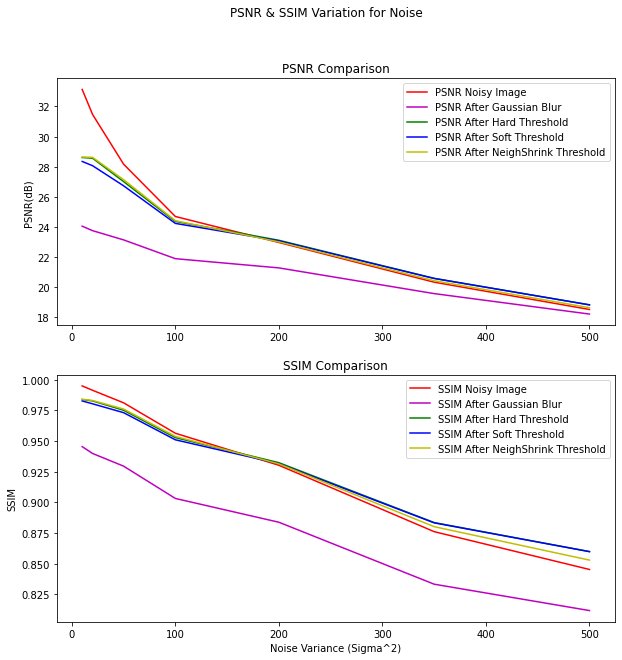

In [ ]:

variance=np.array([10,20,50,100,200,350,500]) #Array of variance to be iterated over
img_psnr_list,blrimg_psnr_list,himg_psnr_list,simg_psnr_list,nimg_psnr_list=[],[],[],[],[] #Initialise empty lists-PSNR
img_ssim_list,blrimg_ssim_list,himg_ssim_list,simg_ssim_list,nimg_ssim_list=[],[],[],[],[] #Initialise empty lists-SSIM

#Iterate over all variances
for var in variance:
    #Add gaussina noise to image
    noisy_cimg=add_gaussian_noise(cimg,var,hide_plots=True)
    img_psnr=PSNR(cimg,noisy_cimg) #Computing PSNR of noisy image
    img_ssim=cSSIM(cimg,noisy_cimg) #Computing SSIM of noisy image
    img_psnr_list.append(img_psnr) #Appending PSNR value for plotting
    img_ssim_list.append(img_ssim) #Appending SSIM value for plotting
    
    #Blurring noisy image with gaussina blur filter
    blrimg=cv2.GaussianBlur(noisy_cimg, (7,7), np.sqrt(var), np.sqrt(var),cv2.BORDER_REFLECT) #Filter variance is same as noise variance
    blrimg_psnr=PSNR(cimg,blrimg) #Computing PSNR of gaussian blurred image
    blrimg_ssim=cSSIM(cimg,blrimg) #Computing SSIM of gaussian blurred image
    blrimg_psnr_list.append(blrimg_psnr) #Appending PSNR value for plotting
    blrimg_ssim_list.append(blrimg_ssim) #Appending SSIM value for plotting
    
    MN=noisy_cimg.shape[0]*noisy_cimg.shape[1] #Number of pixels in the  image
    thresh=np.sqrt(2*var*np.log(MN)) #Calculating the threshold: std_dev*sqrt(2*pixels in image)
    
    himg=hardThresh3(noisy_cimg,thresh,hide_plots=True)
    himg_psnr=PSNR(cimg,himg) #Computing PSNR of hard thresholded image
    himg_ssim=cSSIM(cimg,himg) #Computing SSIM of hard thresholded image
    himg_psnr_list.append(himg_psnr) #Appending PSNR value for plotting
    himg_ssim_list.append(himg_ssim) #Appending SSIM value for plotting
    
    simg=softThresh3(noisy_cimg,thresh,hide_plots=True)
    simg_psnr=PSNR(cimg,simg) #Computing PSNR of soft thresholded image
    simg_ssim=cSSIM(cimg,simg) #Computing SSIM of soft thresholded image
    simg_psnr_list.append(simg_psnr) #Appending PSNR value for plotting
    simg_ssim_list.append(simg_ssim) #Appending SSIM value for plotting
    
    nimg=neighThresh3(noisy_cimg,thresh,hide_plots=True)
    nimg_psnr=PSNR(cimg,nimg) #Computing PSNR of NeighShrink thresholded image
    nimg_ssim=cSSIM(cimg,nimg) #Computing SSIM of NeighShrink thresholded image
    nimg_psnr_list.append(nimg_psnr) #Appending PSNR value for plotting
    nimg_ssim_list.append(nimg_ssim) #Appending SSIM value for plotting

#Plotting indexes for visualisation
plt.figure(figsize=(10,10)) #Setting figure size
plt.suptitle("PSNR & SSIM Variation for Noise") #(Super) Title for the entire plot
#plt.subplots_adjust(wspace=0.5,hspace=0.5) #Adjusting subplot spacing
plt.subplot(2,1,1) #Subplot for PSNR  Comparison
plt.title("PSNR Comparison") #Subplot title
#Plotting psnr values
plt.plot(variance,img_psnr_list,'r',label='PSNR Noisy Image')
plt.plot(variance,blrimg_psnr_list,'m',label='PSNR After Gaussian Blur')
plt.plot(variance,himg_psnr_list,'g',label='PSNR After Hard Threshold')
plt.plot(variance,simg_psnr_list,'b',label='PSNR After Soft Threshold')
plt.plot(variance,nimg_psnr_list,'y',label='PSNR After NeighShrink Threshold')
plt.legend() #Display legend
plt.ylabel("PSNR(dB)")
plt.subplot(2,1,2) #Subplot for SSIM  Comparison
plt.title("SSIM Comparison")  #Subplot title
#Plotting ssim values
plt.plot(variance,img_ssim_list,'r',label='SSIM Noisy Image')
plt.plot(variance,blrimg_ssim_list,'m',label='SSIM After Gaussian Blur')
plt.plot(variance,himg_ssim_list,'g',label='SSIM After Hard Threshold')
plt.plot(variance,simg_ssim_list,'b',label='SSIM After Soft Threshold')
plt.plot(variance,nimg_ssim_list,'y',label='SSIM After NeighShrink Threshold')
plt.legend()#Display legend
plt.ylabel("SSIM")
plt.xlabel('Noise Variance (Sigma^2)')
plt.show() #Display plot

Both PSNR and SSIM index degrades as the noise variances added to the image increase. PSNR is more sensitive at low variance noise addition but becomes less sensitive as the variance of noise added decreases. SSIM progressively dereases with the increase in noise variance.

NeighShrink and Hard Thrsholded images perform better for low variance noise added in images. However, as noise variance added in images in increased, the soft threshold implementation has a better recovery of image.

**E) Noise effect and thresholding effecting HSV and RGB Domains**

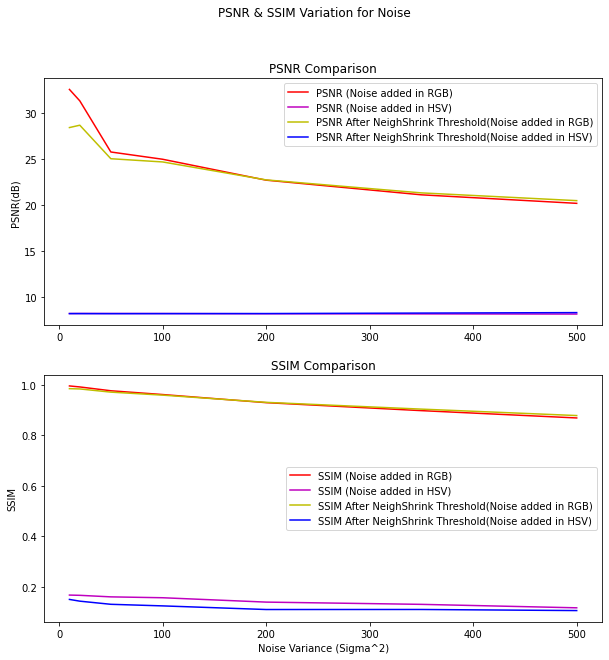

In [ ]:
#Function add noise of same variance to RGB and HSV Domain
def gnoise_add(rgb_img,variance):
  pict=rgb_img.copy()   #Duplicating image
  mean = 0          #taking mean of gaussian noise =0 as AWGN mean = 0
  sigma = variance**0.5    #variance is sigma square
  g_noise = np.random.normal(mean,sigma, pict.shape)  #to generate gaussian noise

  noisy_img=pict+g_noise #adding noise to image(RGB).Image after noise addition exceeds 0 and 255 boundary
  cv2.normalize(noisy_img, noisy_img, 0, 255, cv2.NORM_MINMAX, dtype=-1) #Rescaling back o 0-255 boundary
  noisy_img=noisy_img.astype('uint8') #Type casting back to uint8 format

  g_noise = np.random.normal(mean,sigma, pict.shape[0:2])  #to generate gaussian noise
  hsv_img=cv2.cvtColor(pict, cv2.COLOR_BGR2HSV) #Color image to HSV domain transformation
  vimg=hsv_img[:,:,2].astype('float') #Type conversion of V(Intensity) to float
  vimg=vimg+g_noise #adding noise to V(Intensity).Image after noise addition exceeds 0 and 255 boundary
  cv2.normalize(vimg, vimg, 0, 255, cv2.NORM_MINMAX, dtype=-1) #Rescaling back o 0-255 boundary
  vimg=vimg.astype('uint8') #Type casting back to uint8 format
  hsv_img[:,:,2]=vimg # HSV with noise added in V

  return noisy_img,hsv_img


variance=np.array([10,20,50,100,200,350,500]) #Array of variance to be iterated over
img_psnr_list,hsvimg_psnr_list,nhsvimg_psnr_list,nimg_psnr_list=[],[],[],[] #Initialise empty lists-PSNR
img_ssim_list,hsvimg_ssim_list,nhsvimg_ssim_list,nimg_ssim_list=[],[],[],[] #Initialise empty lists-SSIM
for var in variance:
    noisy_cimg,hsv_img=gnoise_add(cimg,var)
    img_psnr=PSNR(cimg,noisy_cimg) #Computing PSNR of noisy image
    img_ssim=cSSIM(cimg,noisy_cimg) #Computing SSIM of noisy image
    img_psnr_list.append(img_psnr) #Appending PSNR value for plotting
    img_ssim_list.append(img_ssim) #Appending SSIM value for plotting

    hsvimg_psnr=PSNR(cimg,hsv_img) #Computing PSNR of noisy image
    hsvimg_ssim=cSSIM(cimg,hsv_img) #Computing SSIM of noisy image
    hsvimg_psnr_list.append(hsvimg_psnr) #Appending PSNR value for plotting
    hsvimg_ssim_list.append(hsvimg_ssim) #Appending SSIM value for plotting

    MN=noisy_cimg.shape[0]*noisy_cimg.shape[1] #Number of pixels in the  image
    thresh=np.sqrt(2*var*np.log(MN)) #Calculating the threshold: std_dev*sqrt(2*pixels in image)

    nimg=neighThresh3(noisy_cimg,thresh,hide_plots=True)
    nimg_psnr=PSNR(cimg,nimg) #Computing PSNR of NeighShrink thresholded image
    nimg_ssim=cSSIM(cimg,nimg) #Computing SSIM of NeighShrink thresholded image
    nimg_psnr_list.append(nimg_psnr) #Appending PSNR value for plotting
    nimg_ssim_list.append(nimg_ssim) #Appending SSIM value for plotting

    nhsvimg=neighThresh3(hsv_img,thresh,hide_plots=True)
    nhsvimg_psnr=PSNR(cimg,nhsvimg) #Computing PSNR of NeighShrink thresholded image
    nhsvimg_ssim=cSSIM(cimg,nhsvimg) #Computing SSIM of NeighShrink thresholded image
    nhsvimg_psnr_list.append(nhsvimg_psnr) #Appending PSNR value for plotting
    nhsvimg_ssim_list.append(nhsvimg_ssim) #Appending SSIM value for plotting

#Plotting indexes for visualisation
plt.figure(figsize=(10,10)) #Setting figure size
plt.suptitle("PSNR & SSIM Variation for Noise") #(Super) Title for the entire plot
#plt.subplots_adjust(wspace=0.5,hspace=0.5) #Adjusting subplot spacing
plt.subplot(2,1,1) #Subplot for PSNR  Comparison
plt.title("PSNR Comparison") #Subplot title
#Plotting psnr values
plt.plot(variance,img_psnr_list,'r',label='PSNR (Noise added in RGB)')
plt.plot(variance,hsvimg_psnr_list,'m',label='PSNR (Noise added in HSV)')
plt.plot(variance,nimg_psnr_list,'y',label='PSNR After NeighShrink Threshold(Noise added in RGB)')
plt.plot(variance,nhsvimg_psnr_list,'b',label='PSNR After NeighShrink Threshold(Noise added in HSV)')
plt.legend() #Display legend
plt.ylabel("PSNR(dB)")
plt.subplot(2,1,2) #Subplot for SSIM  Comparison
plt.title("SSIM Comparison")  #Subplot title
#Plotting ssim values
plt.plot(variance,img_ssim_list,'r',label='SSIM (Noise added in RGB)')
plt.plot(variance,hsvimg_ssim_list,'m',label='SSIM (Noise added in HSV)')
plt.plot(variance,nimg_ssim_list,'y',label='SSIM After NeighShrink Threshold(Noise added in RGB)')
plt.plot(variance,nhsvimg_ssim_list,'b',label='SSIM After NeighShrink Threshold(Noise added in HSV)')
plt.legend()#Display legend
plt.ylabel("SSIM")
plt.xlabel('Noise Variance (Sigma^2)')
plt.show() #Display plot

Noise added to the Value in HSV domain significantly degarades the image. It is reflected in both the PSNR and SSIM index.For the noise added in RGB channels, the SSIM and PSNR index improved at higher noise variance with NeighShrink threshold. However for noise added in V of HSV domain, the PSNR shows slight improvement but SSIM index shows significant deradation when NeighShrink thresholding is applied.

**Question 4**

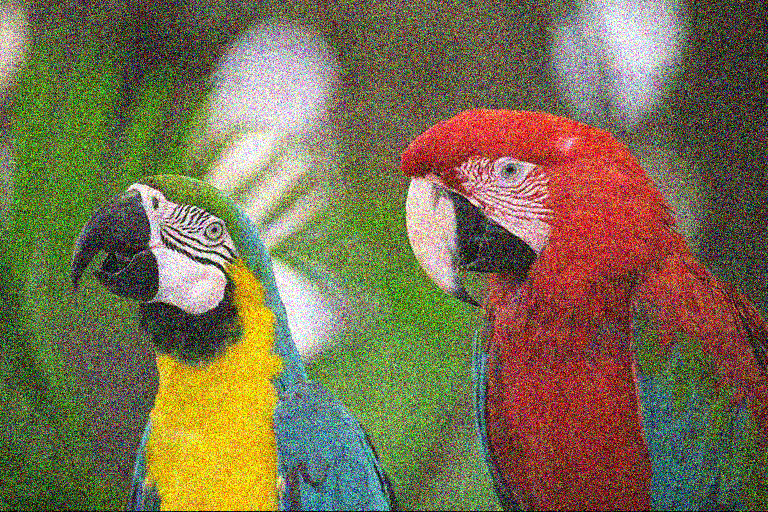

In [ ]:
#the noisy image is chosen with unknown variance and the comparison of all methods is performed by assuming various values of noise variance 
#as trial and error
img4 = cv2.imread("/content/birds_q4.png")       #read the image
cv2_imshow(img4)  

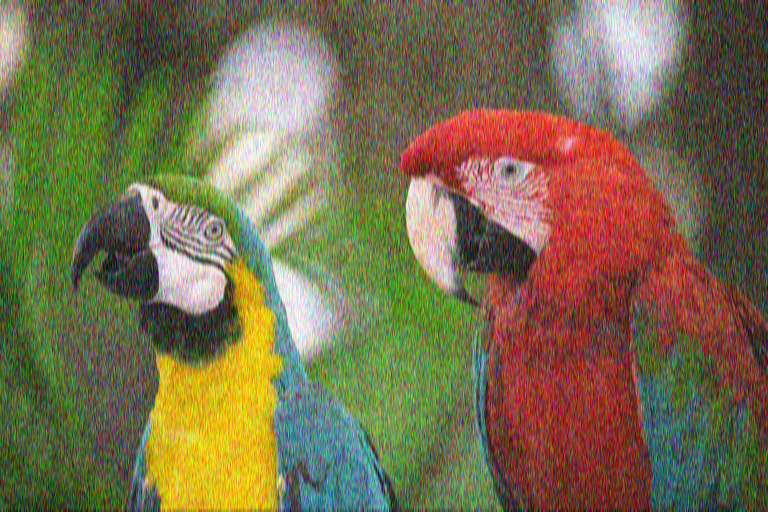

SSIM value: 0.7846659167889606


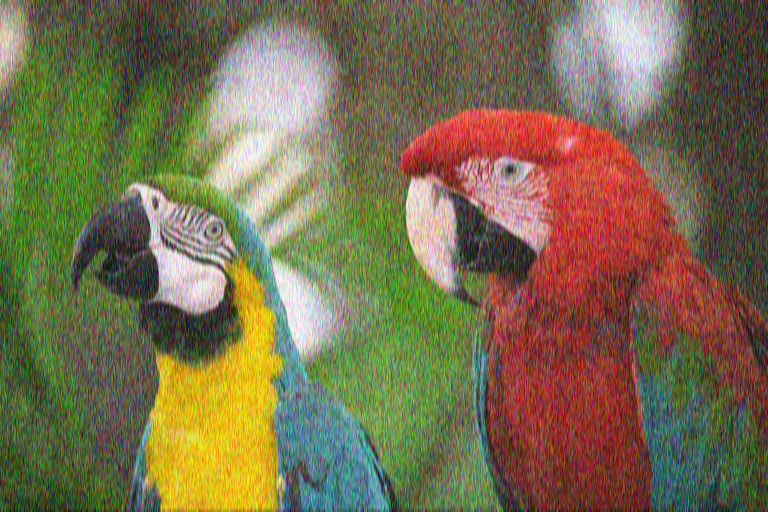

SSIM value: 0.7838130207935459


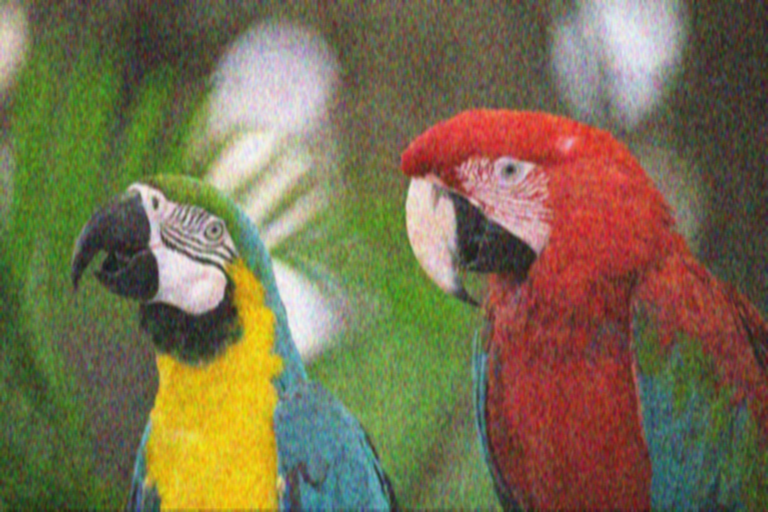

SSIM value: 0.7314557697537648


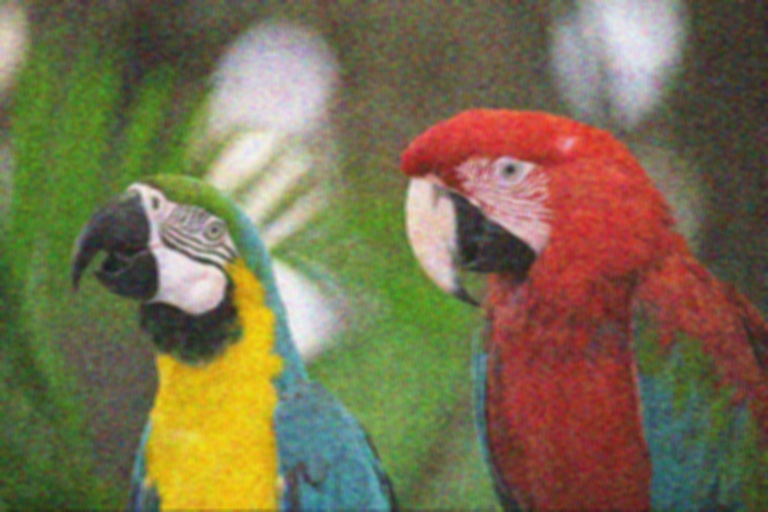

SSIM value: 0.7025034099325094


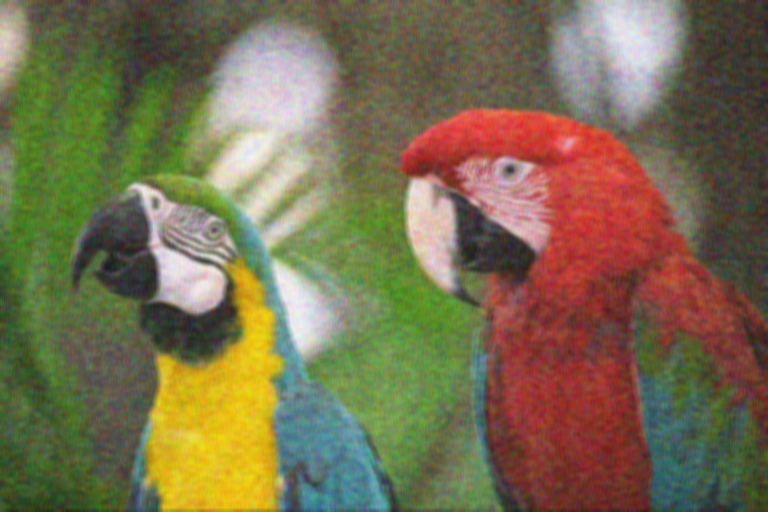

SSIM value: 0.6987125835701002


In [ ]:
#Applying gaussian filter to the image with varying variance 
variance4 = np.array([0.005, 0.1,1,10,100])
for var in variance4:
  
  #Blurring noisy image with gaussina blur filter
  blrimg=cv2.GaussianBlur(img4, (7,7), np.sqrt(var), np.sqrt(var),cv2.BORDER_REFLECT) #Filter variance is same as noise variance
  blrimg_psnr=PSNR(img4,blrimg) #Computing PSNR of gaussian blurred image
  blrimg_ssim=cSSIM(img4,blrimg) #Computing SSIM of gaussian blurred image
  #blrimg_psnr_list.append(blrimg_psnr) #Appending PSNR value for plotting
  cv2_imshow(blrimg)
  print('SSIM value:',blrimg_ssim)

noise reduction using hard threholding 


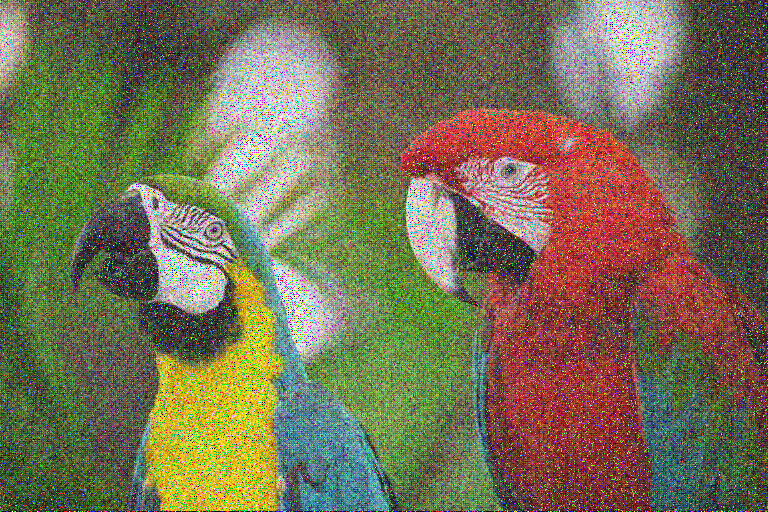

SSIM using hard thresholding 0.7290639018915136
noise reduction using soft threholding


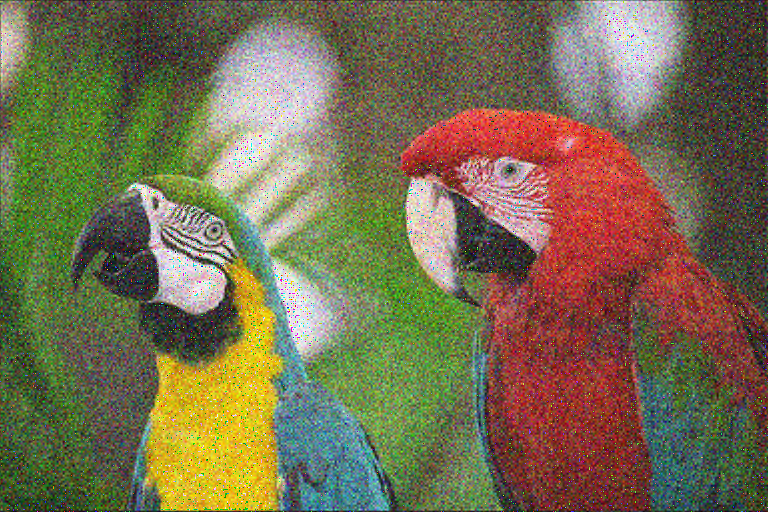

SSIM using soft thresholding 0.7527435123864037
noise reduction using gaussian filter


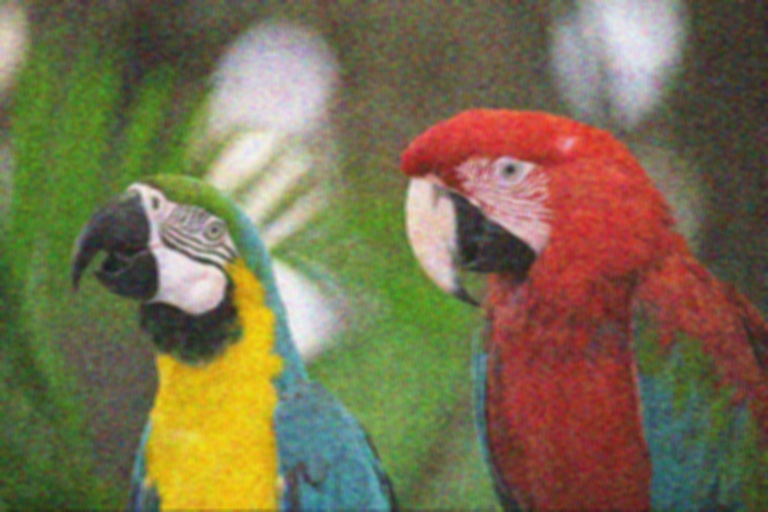

SSIM using hard thresholding 0.7025034099325094


In [ ]:
#comapring all three methods at var =10
var=10
MN=img4.shape[0]*img4.shape[1] #Number of pixels in the  image
th=np.sqrt(2*10*np.log(MN)) #Calculating the threshold: std_dev*sqrt(2*pixels in image)
himg=hardThresh3(img4,th,hide_plots=True)
print('noise reduction using hard threholding ')
cv2_imshow(himg)
himg_ssim=cSSIM(img4,himg) #Computing SSIM of hard threshold
print('SSIM using hard thresholding',himg_ssim)
simg=softThresh3(img4,thresh,hide_plots=True)
print('noise reduction using soft threholding')
cv2_imshow(simg)
simg_ssim=cSSIM(img4,simg) #Computing SSIM of soft threshold
print('SSIM using soft thresholding',simg_ssim)
blrimg=cv2.GaussianBlur(img4, (7,7), np.sqrt(var), np.sqrt(var),cv2.BORDER_REFLECT) #Filter variance is same as noise variance
print('noise reduction using gaussian filter')
cv2_imshow(blrimg)
gblrimg_ssim=cSSIM(img4,blrimg) #Computing SSIM of gaussian blur threshold
print('SSIM using hard thresholding',gblrimg_ssim)

Since SSIM order at variance = 10 is soft thresholding > hard thresholding > gaussian filter, Soft thresholding is more effective as compared to hard thresholding and gaussian filter. 

noise reduction using hard threholding 


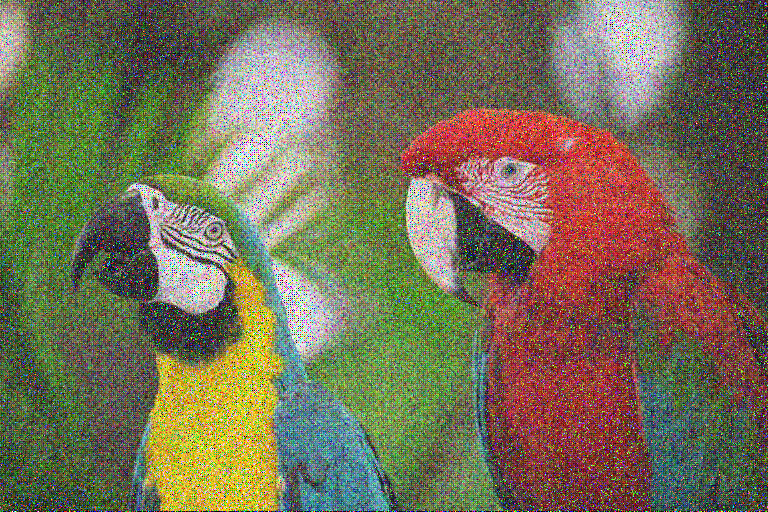

SSIM using hard thresholding 0.7270647345174783
noise reduction using soft threholding


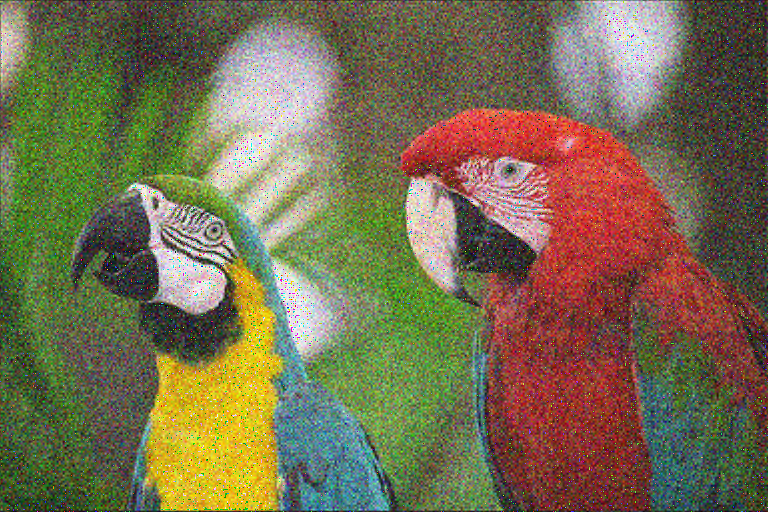

SSIM using soft thresholding 0.7527435123864037
noise reduction using gaussian filter


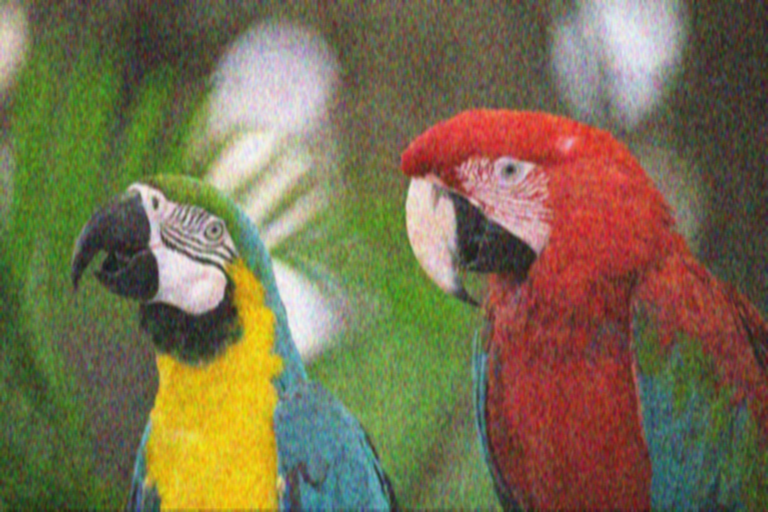

SSIM using hard thresholding 0.7270647345174783


In [ ]:
#comapring all three (gaussian LPF, hard thresholding and soft thresholding) methods at var =1
var=1
MN=img4.shape[0]*img4.shape[1] #Number of pixels in the  image
th=np.sqrt(2*1*np.log(MN)) #Calculating the threshold: std_dev*sqrt(2*pixels in image)
himg=hardThresh3(img4,th,hide_plots=True)
print('noise reduction using hard threholding ')
cv2_imshow(himg)
himg_ssim=cSSIM(img4,himg) #Computing SSIM of hard threshold
print('SSIM using hard thresholding',himg_ssim)
simg=softThresh3(img4,thresh,hide_plots=True)
print('noise reduction using soft threholding')
cv2_imshow(simg)
simg_ssim=cSSIM(img4,simg) #Computing SSIM of soft threshold
print('SSIM using soft thresholding',simg_ssim)
blrimg=cv2.GaussianBlur(img4, (7,7), np.sqrt(var), np.sqrt(var),cv2.BORDER_REFLECT) #Filter variance is same as noise variance
print('noise reduction using gaussian filter')
cv2_imshow(blrimg)
blrimg_ssim=cSSIM(img4,himg) #Computing SSIM of gaussian blurring
print('SSIM using hard thresholding',blrimg_ssim)


At variance =1, SSIM value of hard threshold and gaussian filtering is almost same but is lesser than soft thresholding. Hence, soft thresholding is effective for this image. 

noise reduction using hard threholding 


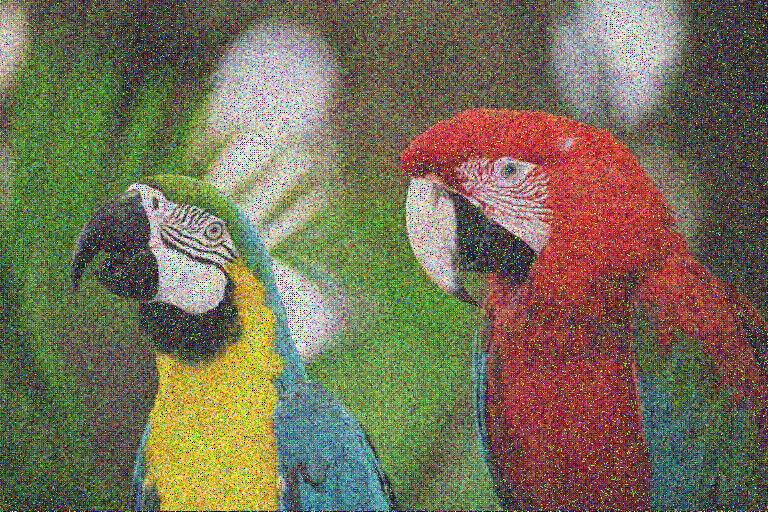

SSIM using hard thresholding 0.7269484262291438
noise reduction using soft threholding


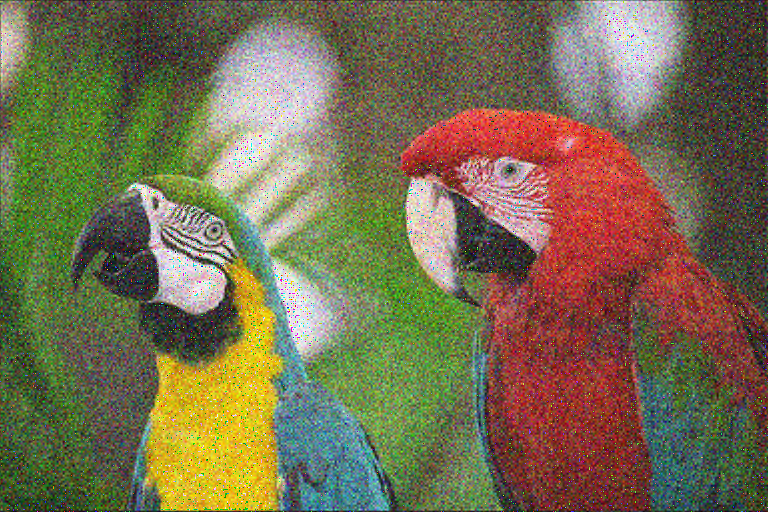

SSIM using soft thresholding 0.7527435123864037
noise reduction using gaussian filter


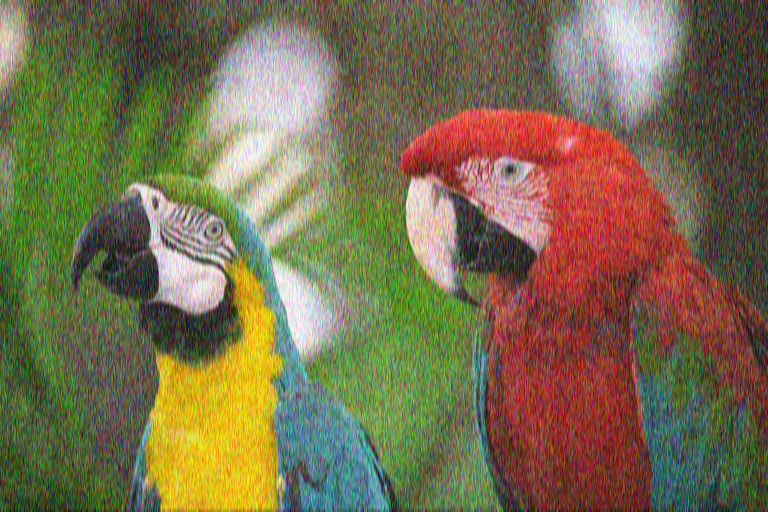

SSIM using hard thresholding 0.7269484262291438


In [ ]:
#comapring all three (gaussian LPF, hard thresholding and soft thresholding) methods at var =1
var=0.1
MN=img4.shape[0]*img4.shape[1] #Number of pixels in the  image

th=np.sqrt(2*0.1*np.log(MN)) #Calculating the threshold: std_dev*sqrt(2*pixels in image)
himg=hardThresh3(img4,th,hide_plots=True)
print('noise reduction using hard threholding ')
cv2_imshow(himg)
himg_ssim=cSSIM(img4,himg) #Computing SSIM of hard threshold
print('SSIM using hard thresholding',himg_ssim)
simg=softThresh3(img4,thresh,hide_plots=True)
print('noise reduction using soft threholding')
cv2_imshow(simg)
simg_ssim=cSSIM(img4,simg) #Computing SSIM of soft threshold
print('SSIM using soft thresholding',simg_ssim)
blrimg=cv2.GaussianBlur(img4, (7,7), np.sqrt(var), np.sqrt(var),cv2.BORDER_REFLECT) #Filter variance is same as noise variance
print('noise reduction using gaussian filter')
cv2_imshow(blrimg)
blrimg_ssim=cSSIM(img4,himg) #Computing SSIM of gaussian blurring
print('SSIM using hard thresholding',blrimg_ssim)


At variance =0.1, SSIM value of hard threshold and gaussian filtering is almost same but is lesser than soft thresholding. Hence, soft thresholding is effective for this image. 